#iteration and #patches are same to Ricardo's experiment m9_22 model

Modification

Training Date: 2015/03-2016/02 12 months (Ricardo: 2015 06)

In [2]:
%matplotlib inline
import os
import sys
import copy
import itertools
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import tensorflow as tf

In [3]:
sys.path.insert(1, os.path.join(sys.path[0],"/home/tkurihana/scratch-midway2/data/MOD06/" ) )
from analysis_lib import _get_swath, _load_tif_data
from analysis_lib import _get_colors, _gen_patches, _anl_agl
from analysis_lib import cluster_plotting2, cluster_plotting

In [4]:
gee_datadir = '/home/tkurihana/scratch-midway2/data/GEE'
swath_filename = '2017-01-01_MOD09GA_mixed-cell.tif'
swath1 = _get_swath(gee_datadir, swath_filename)

 Shape  (2219, 4991, 7)


In [5]:
model_dir='/project/foster/clouds/output/m9_22_Global_ALL_2015_2016/'
ENCODER_DEF=model_dir+'encoder.json'
ENCODER_WEIGHTS=model_dir+'encoder-160000.h5'
with open(ENCODER_DEF,"r") as f:
    encoder = tf.keras.models.model_from_json(f.read())
encoder.load_weights(ENCODER_WEIGHTS)

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/tensorflow/python/keras/layers/core.py:791: UserWarning: models is not loaded, but a Lambda layer uses it. It may cause errors.
  , UserWarning)


In [6]:
SHAPE = 128, 128, 7

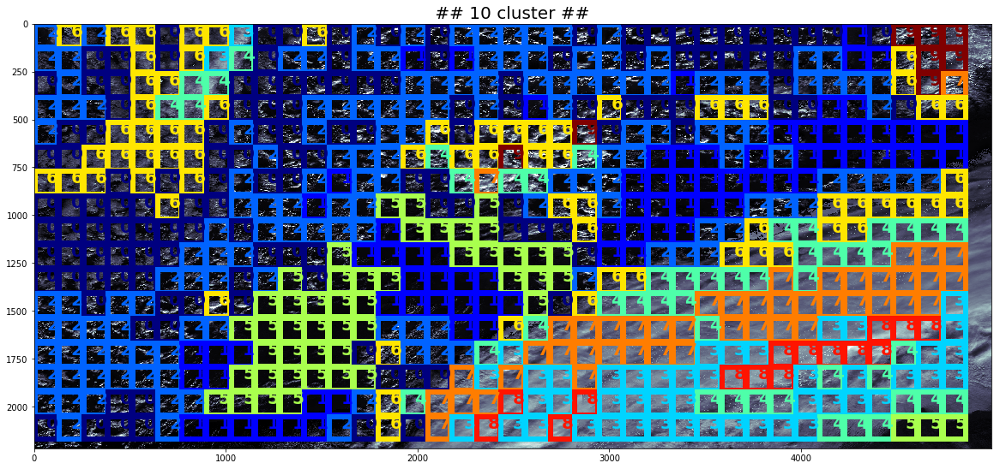

In [7]:
patches = _gen_patches(swath1, normalization=True)
for icluster in [10]:
    _patches_labels = _anl_agl(encoder, patches, clusters=icluster)
    colors = _get_colors(n=icluster)
    cluster_plotting(swath1, patches,_patches_labels, SHAPE, colors, ncluster=icluster)

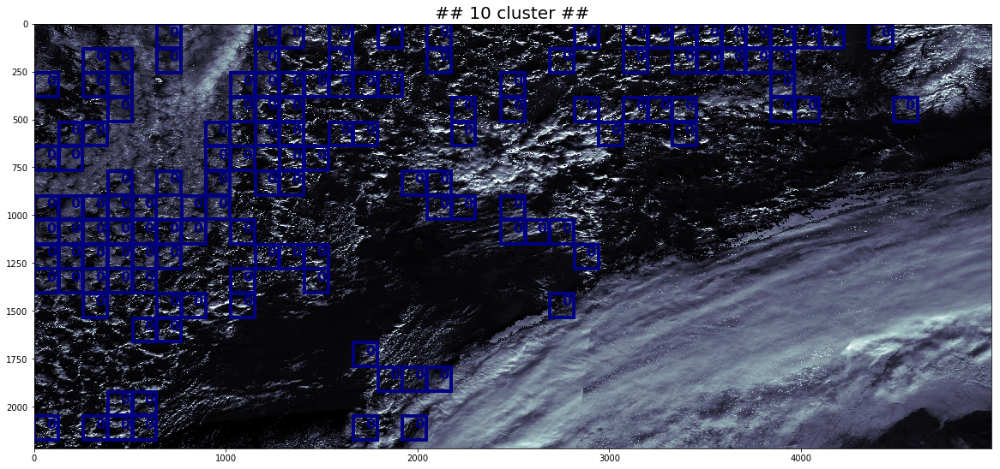

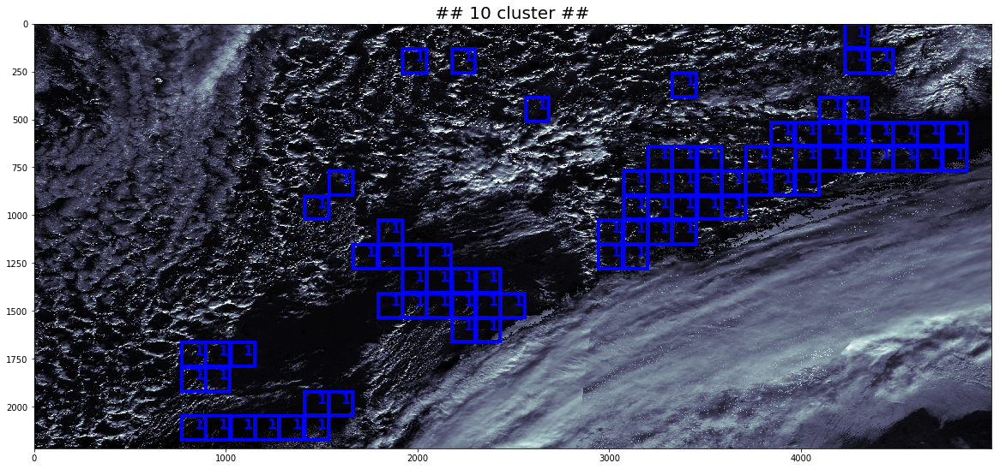

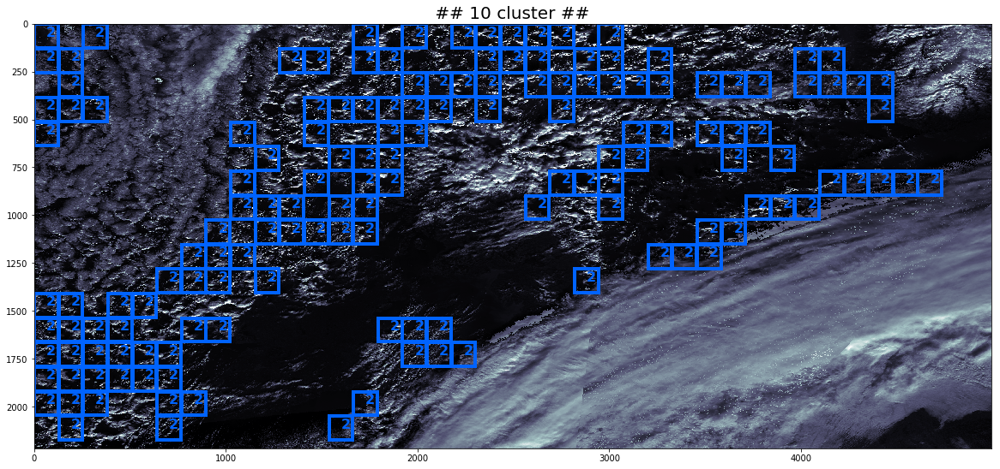

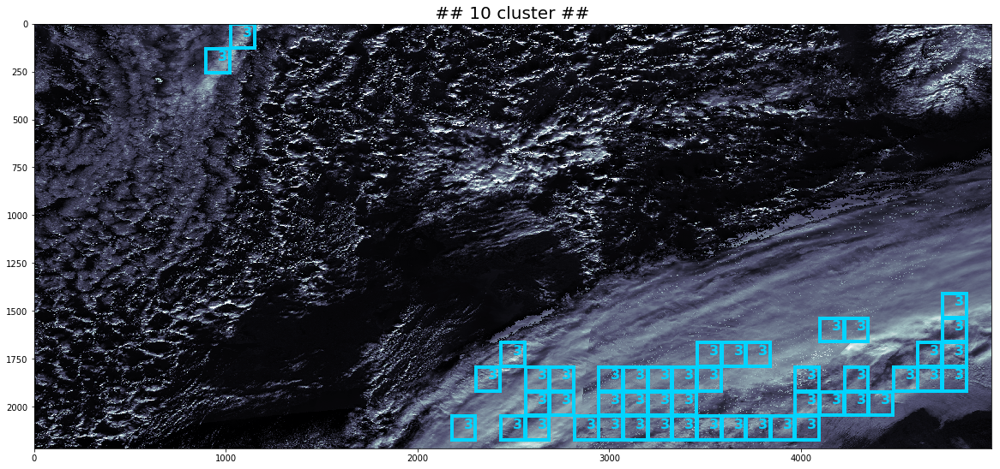

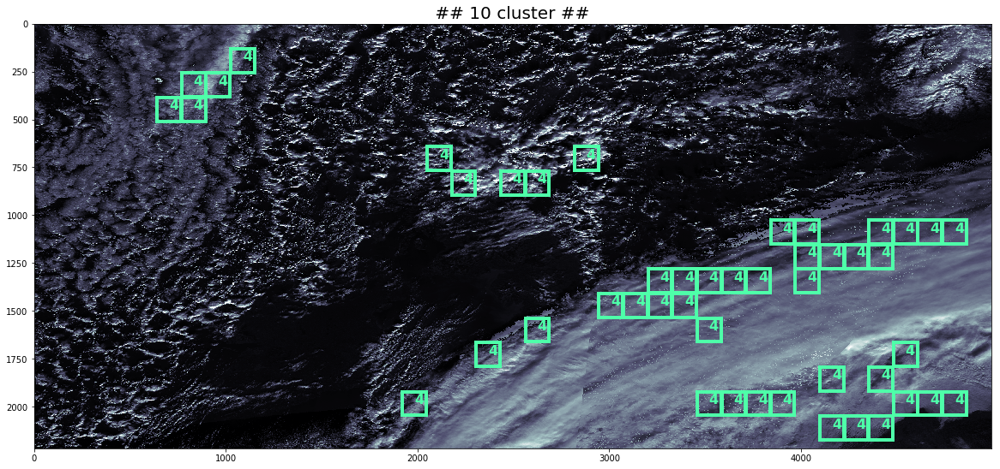

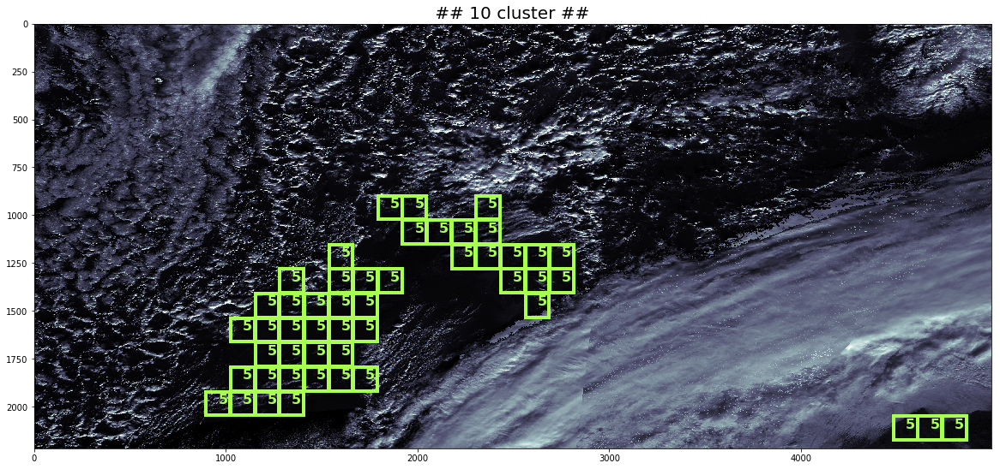

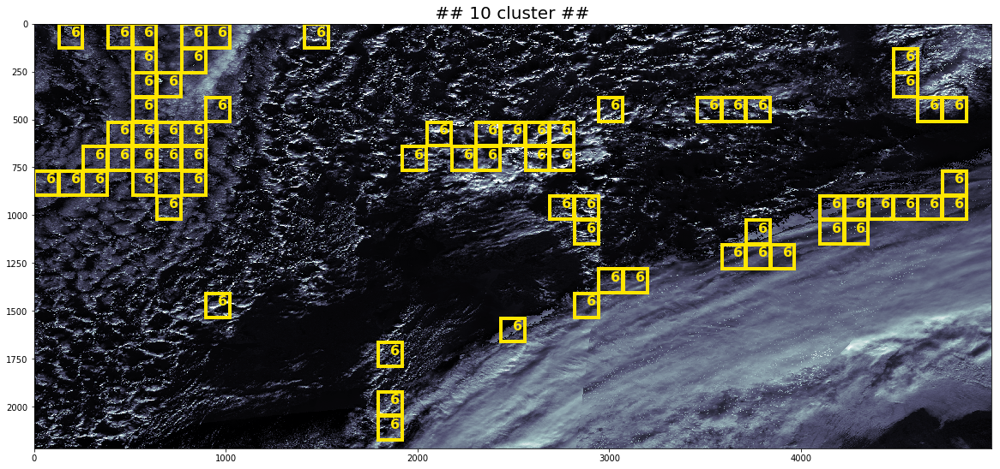

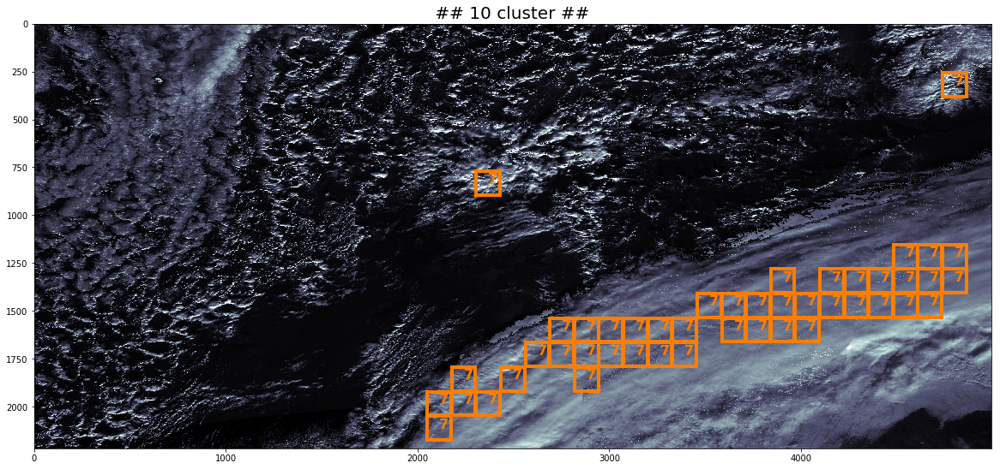

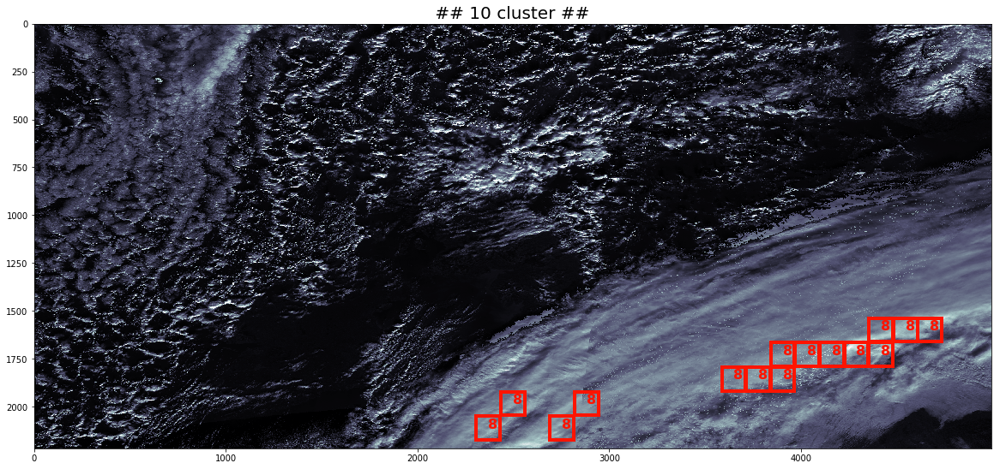

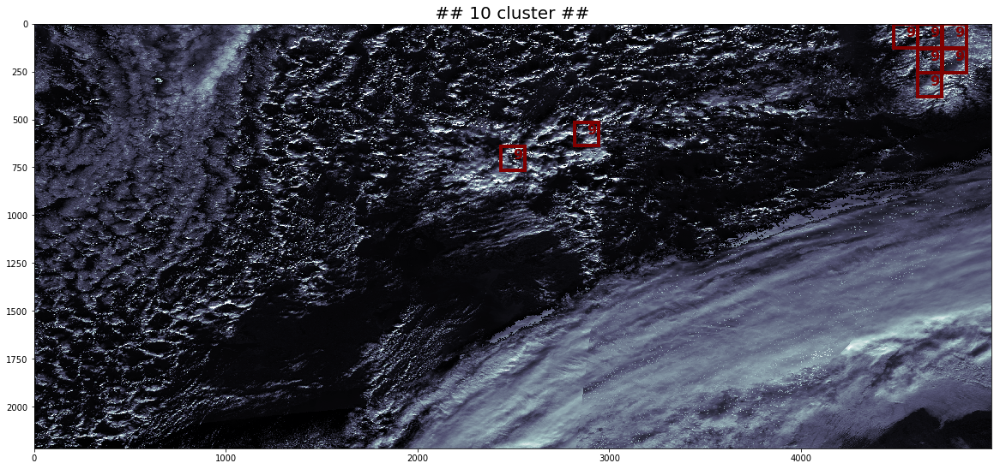

In [8]:
for target_cluster in range(10):
    cluster_plotting2(swath1, patches,_patches_labels, SHAPE, colors, ncluster=10, target_cluster=target_cluster)